In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

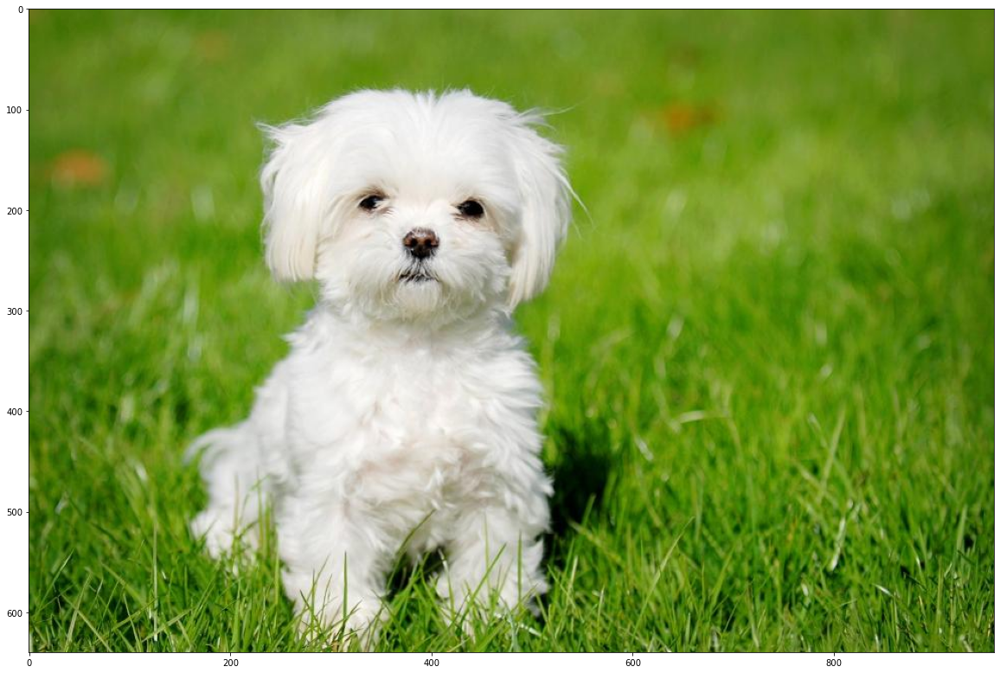

In [2]:
dog = cv2.imread('img/dog.jpg')
rgb_dog = cv2.cvtColor(dog, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dog)

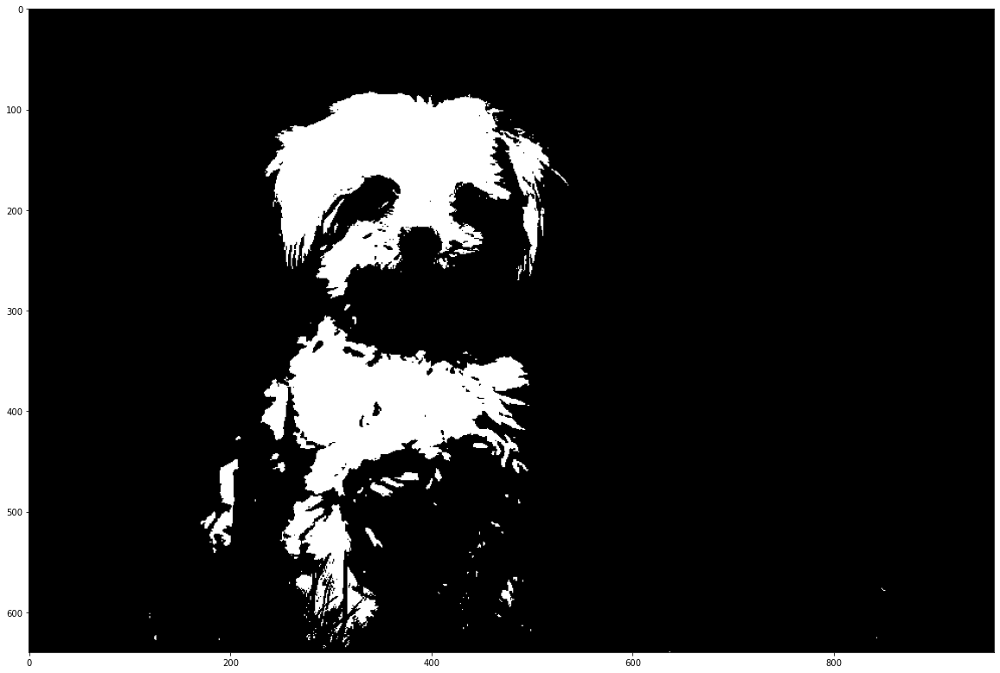

In [5]:
gray_dog = cv2.cvtColor(dog, cv2.COLOR_BGR2GRAY)
retval,dst = cv2.threshold(gray_dog, 220, 255, cv2.THRESH_BINARY )
rgb_dist = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

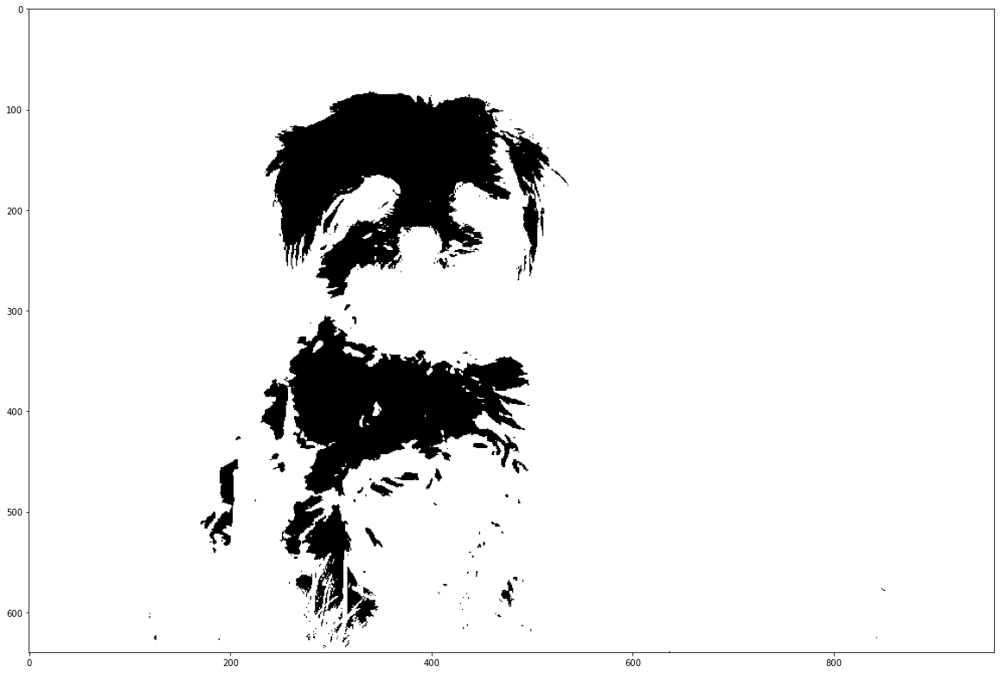

In [6]:
retval,dst = cv2.threshold(gray_dog, 220, 255, cv2.THRESH_BINARY_INV )
rgb_dist = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

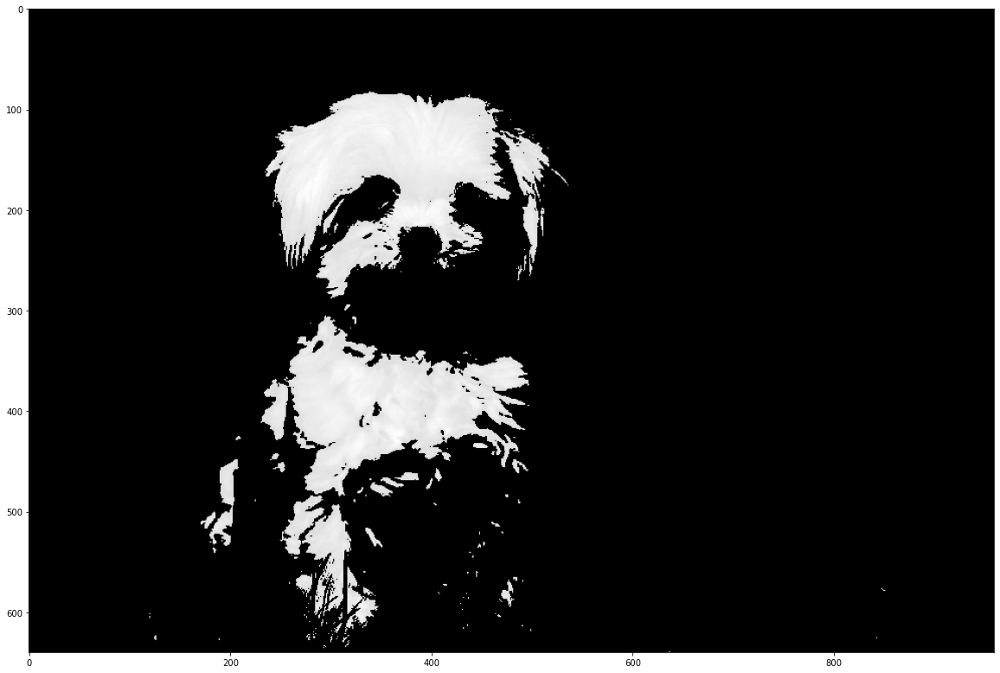

In [7]:
retval,dst = cv2.threshold(gray_dog, 220, 255, cv2.THRESH_TOZERO )
rgb_dist = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

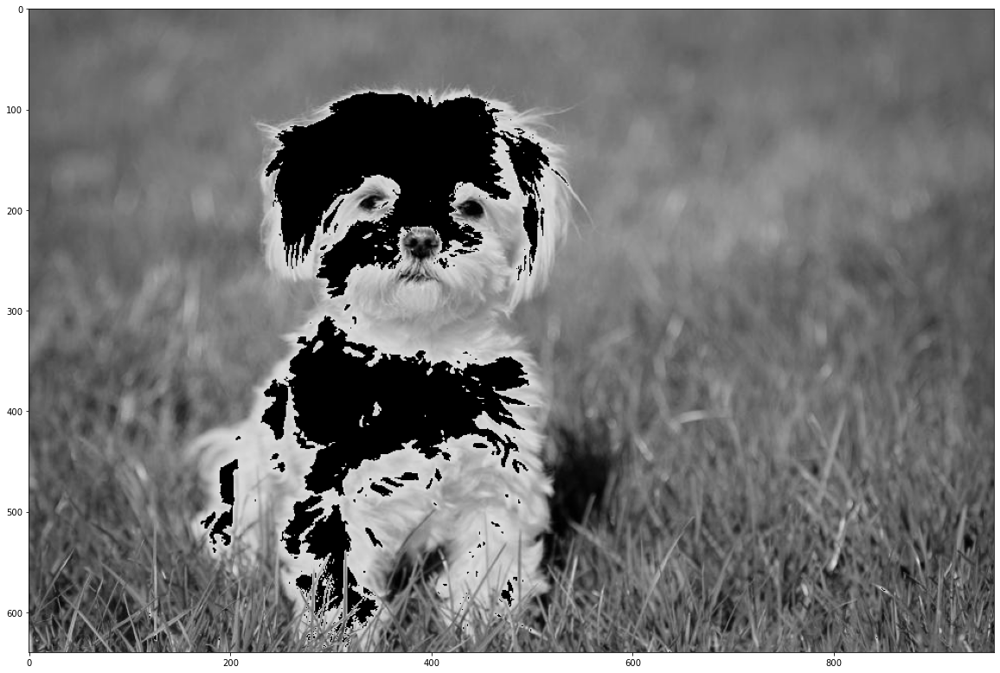

In [8]:
retval,dst = cv2.threshold(gray_dog, 220, 255, cv2.THRESH_TOZERO_INV )
rgb_dist = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

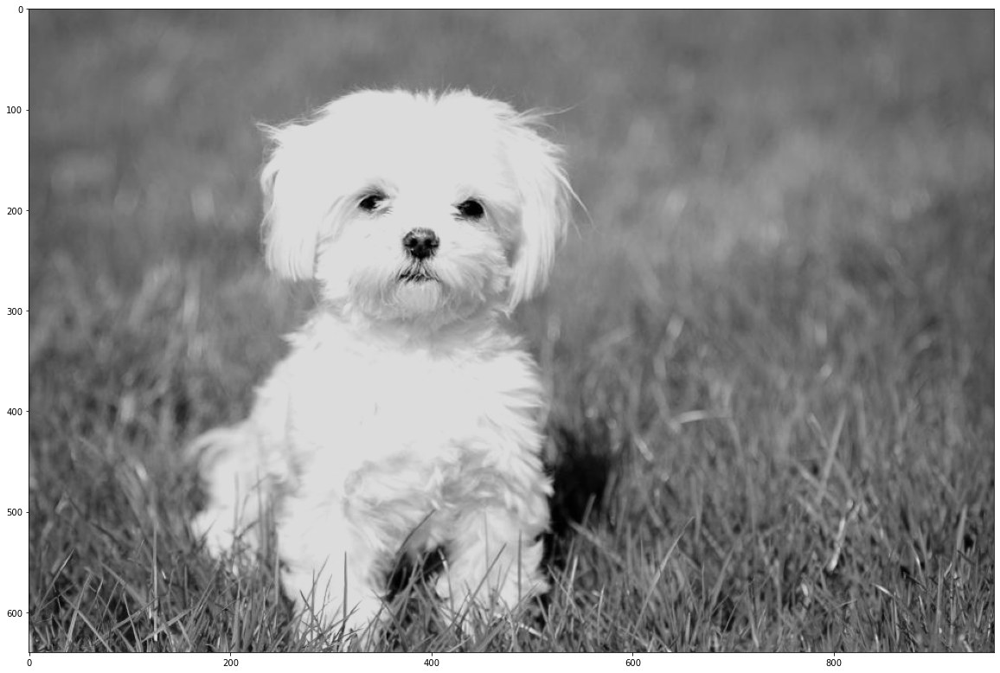

In [9]:
retval,dst = cv2.threshold(gray_dog, 220, 255, cv2.THRESH_TRUNC )
rgb_dist = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

#### Otsu Thresholding  
only applied to special cases

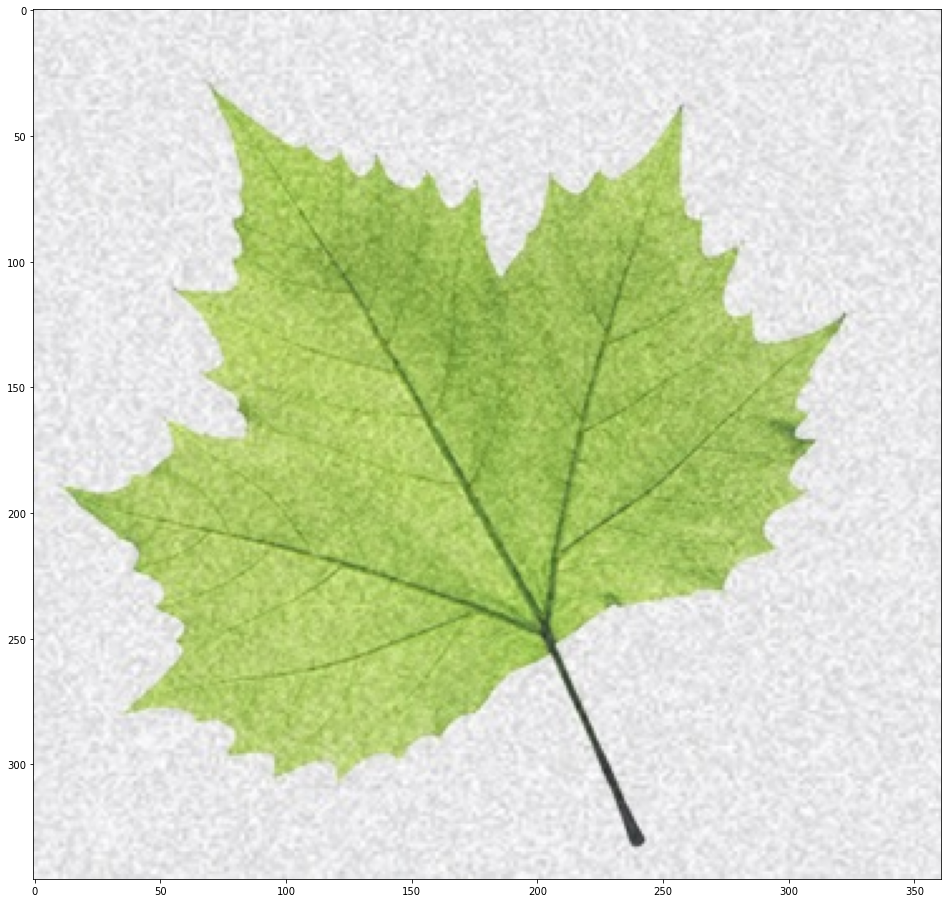

In [14]:
leaf = cv2.imread('img/noisy_leaf.jpg')
rgb_leaf = cv2.cvtColor(leaf, cv2.COLOR_BGR2RGB)
gray_leaf = cv2.cvtColor(leaf, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(20,16))
plt.imshow(rgb_leaf)

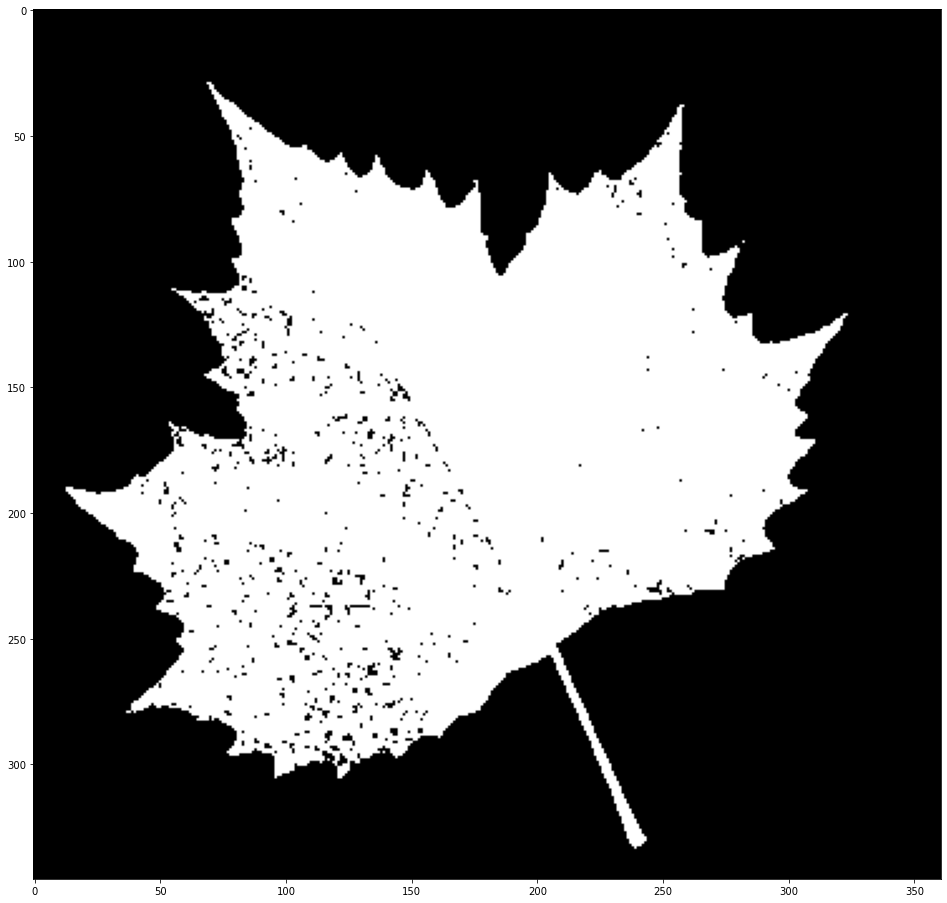

In [18]:
ret, otsu = cv2.threshold(gray_leaf,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
otsu_rgb_leaf = cv2.cvtColor(otsu, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(otsu_rgb_leaf)

### Adaptive Thresolding

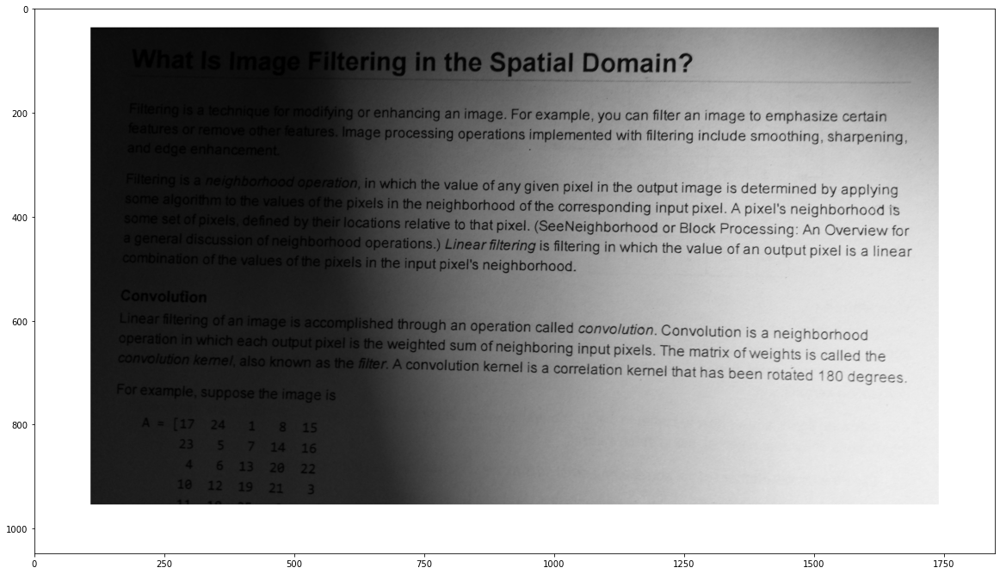

In [28]:
notes = cv2.imread('img/notes.png')
gray_notes = cv2.imread('img/notes.png',cv2.IMREAD_GRAYSCALE)
rgb_gray_notes = cv2.cvtColor(gray_notes, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_gray_notes)

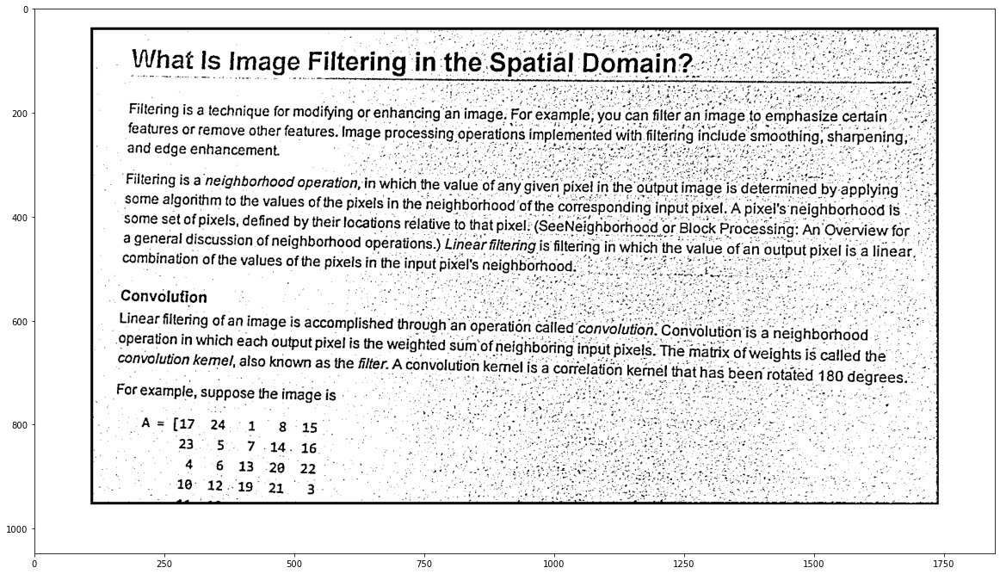

In [33]:
dst = cv2.adaptiveThreshold(gray_notes, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11,3)
rgb_gray_notes = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_gray_notes)

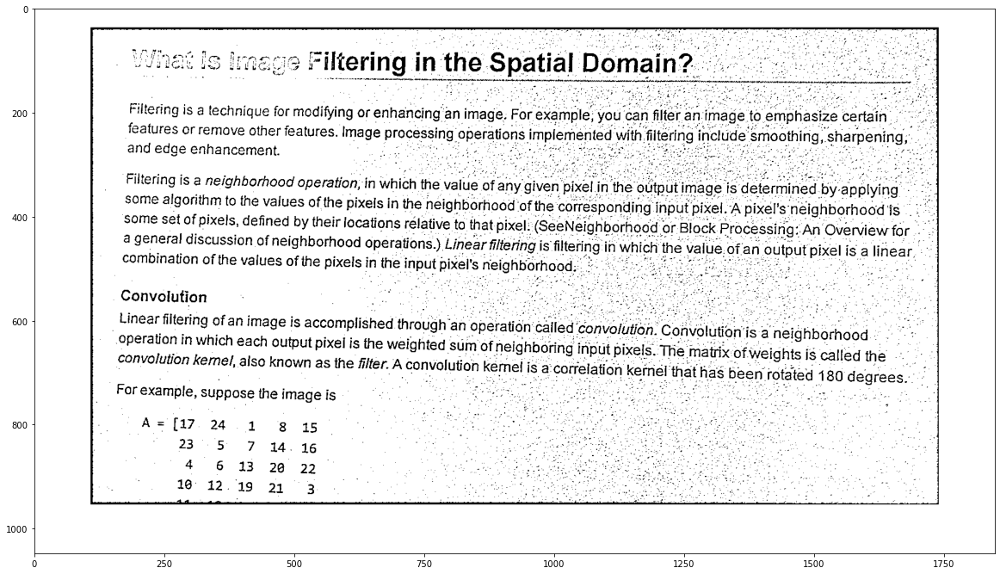

In [34]:
dst = cv2.adaptiveThreshold(gray_notes, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11,3)
rgb_gray_notes = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_gray_notes)

### Morphological transforms.

In [36]:
import numpy as np
kernel = np.ones((3,3), np.uint8)
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

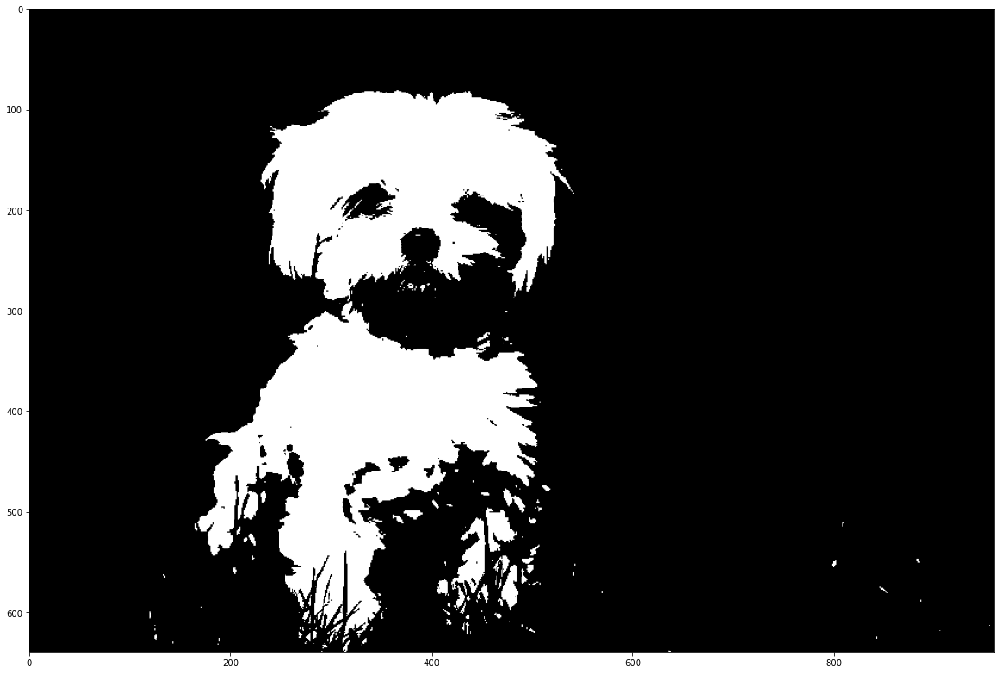

In [41]:
# Dilation
ret, threshold = cv2.threshold(gray_dog, 200,255,cv2.THRESH_BINARY)
rgb_dist = cv2.cvtColor(threshold, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)


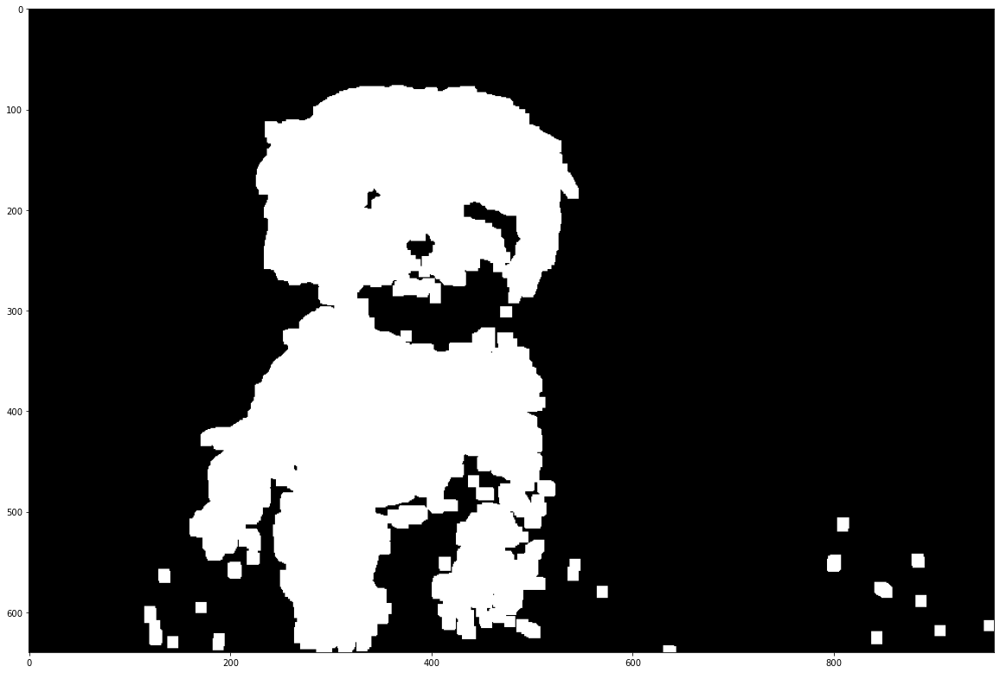

In [43]:
#### Dilation
dilation = cv2.dilate(threshold, kernel, iterations=5)

### Iterations and kernels need to be taken care 

rgb_dist = cv2.cvtColor(dilation, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)


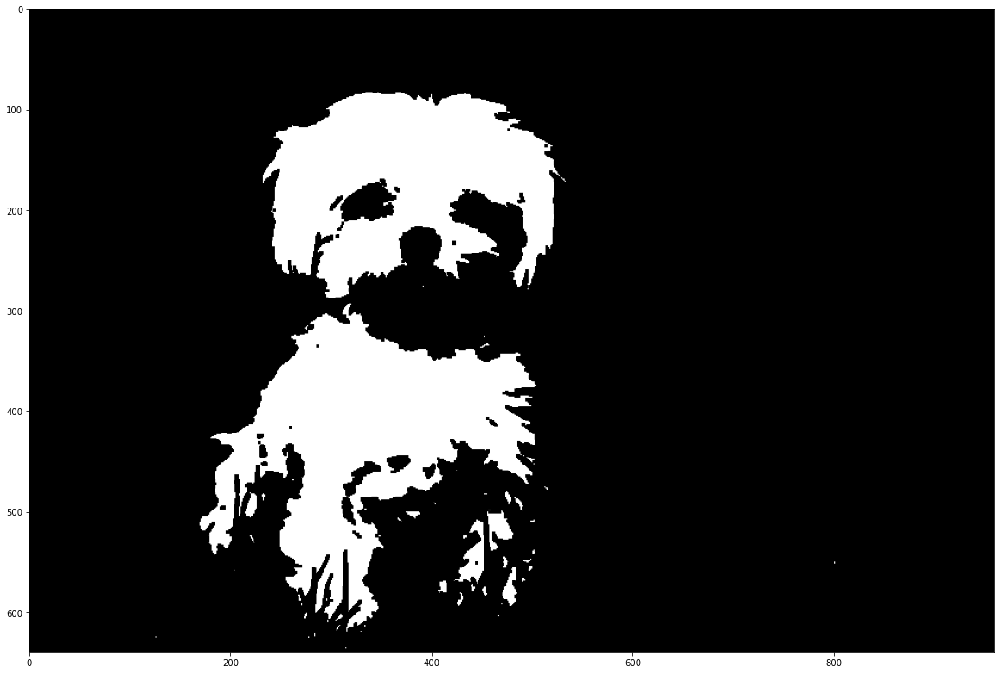

In [44]:
erosion = cv2.erode(threshold, kernel)

rgb_dist = cv2.cvtColor(erosion, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

In [50]:
### We can also use cv2.getstructuring element to define kernel
### you can play with cv2.Morph shape.
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,9))
kernel

array([[0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0],
       [1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=uint8)

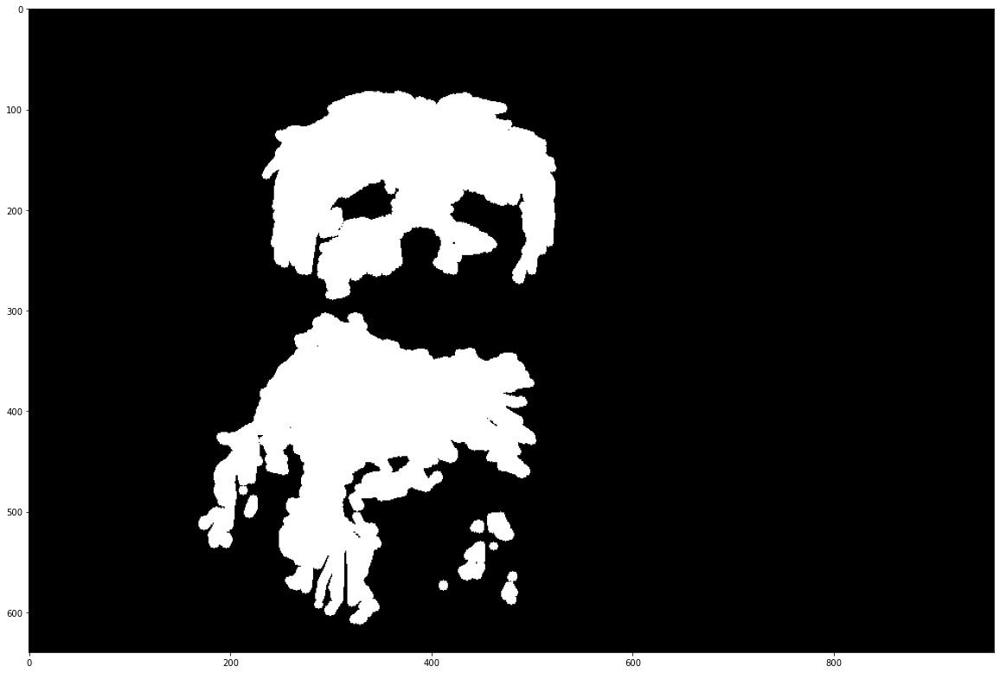

In [51]:
## Opening

opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)

rgb_dist = cv2.cvtColor(opening, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

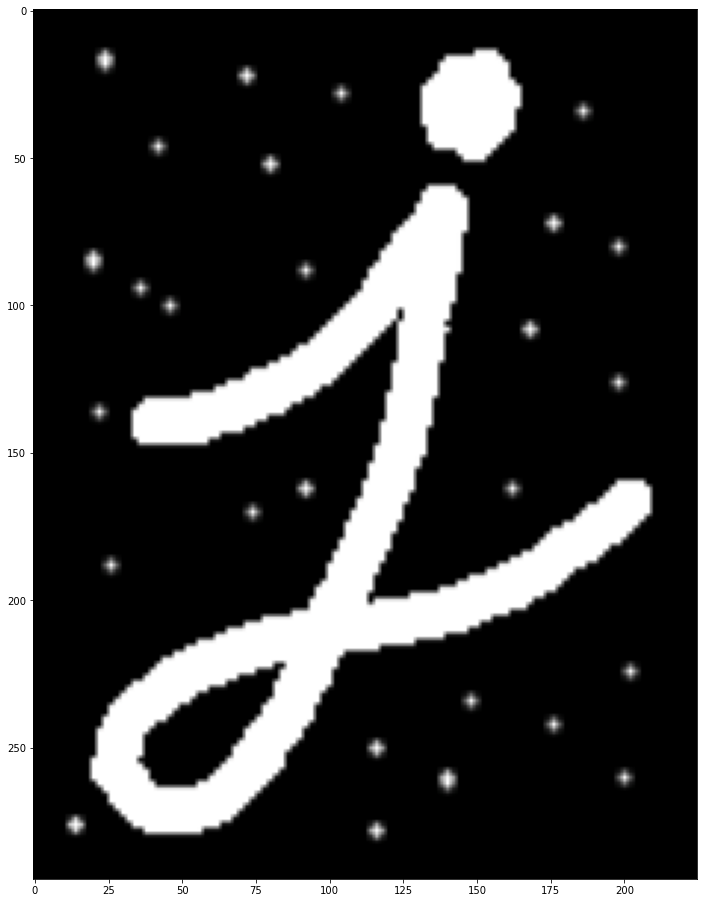

In [53]:
j2 = cv2.imread('img/j2.png')

rgb_dist = cv2.cvtColor(j2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

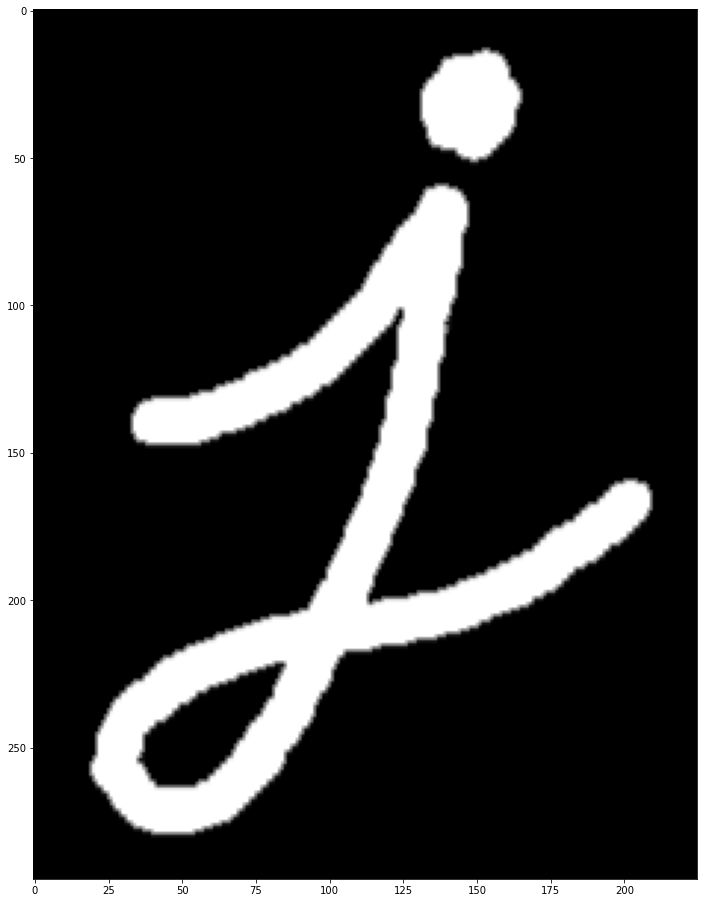

In [52]:
# opening with other image

j2 = cv2.imread('img/j2.png')
opening = cv2.morphologyEx(j2, cv2.MORPH_OPEN, kernel)
rgb_dist = cv2.cvtColor(opening, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)


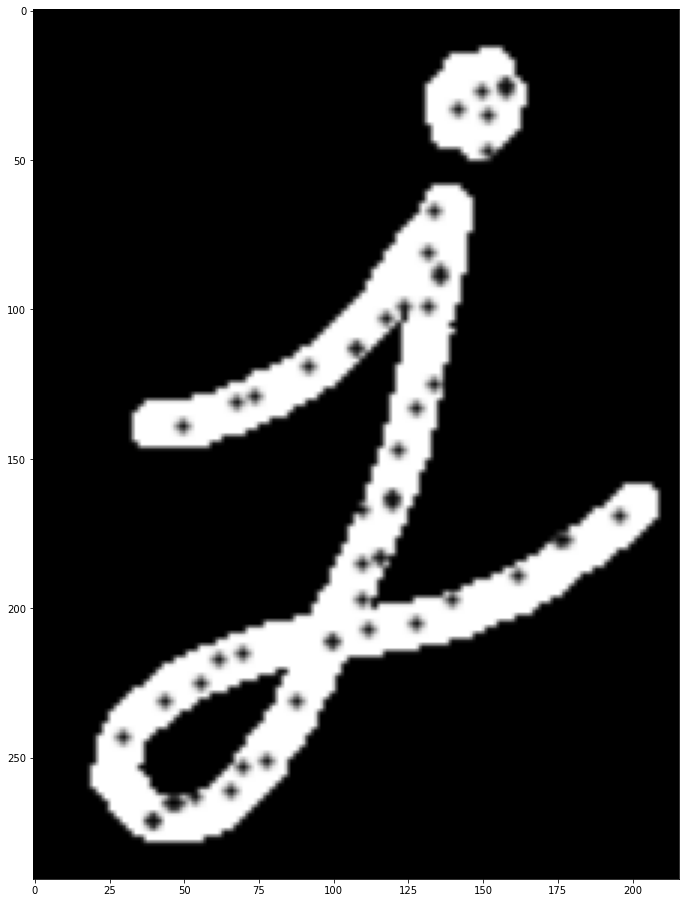

In [54]:
## Closing

j1 = cv2.imread('img/j1.png')

rgb_dist = cv2.cvtColor(j1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

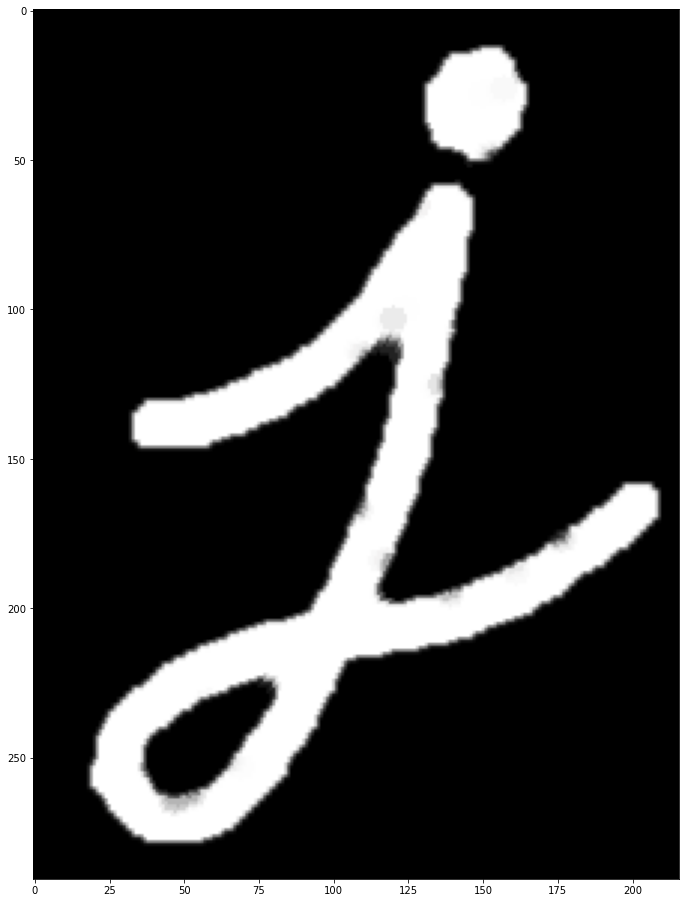

In [55]:
closing = cv2.morphologyEx(j1, cv2.MORPH_CLOSE, kernel)
rgb_dist = cv2.cvtColor(closing, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_dist)

### Kernels/Filters

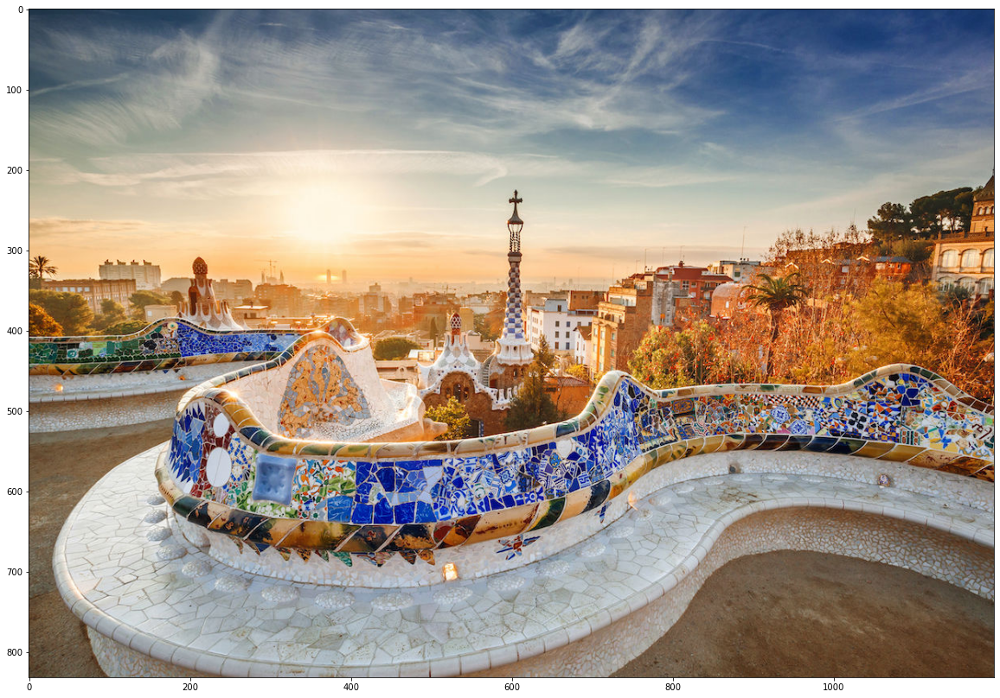

In [56]:
img = cv2.imread('img/barcelona.jpg')
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_img)

### Blur Kernel

In [61]:
blur_kernel = np.ones((7,7), np.float32)/49

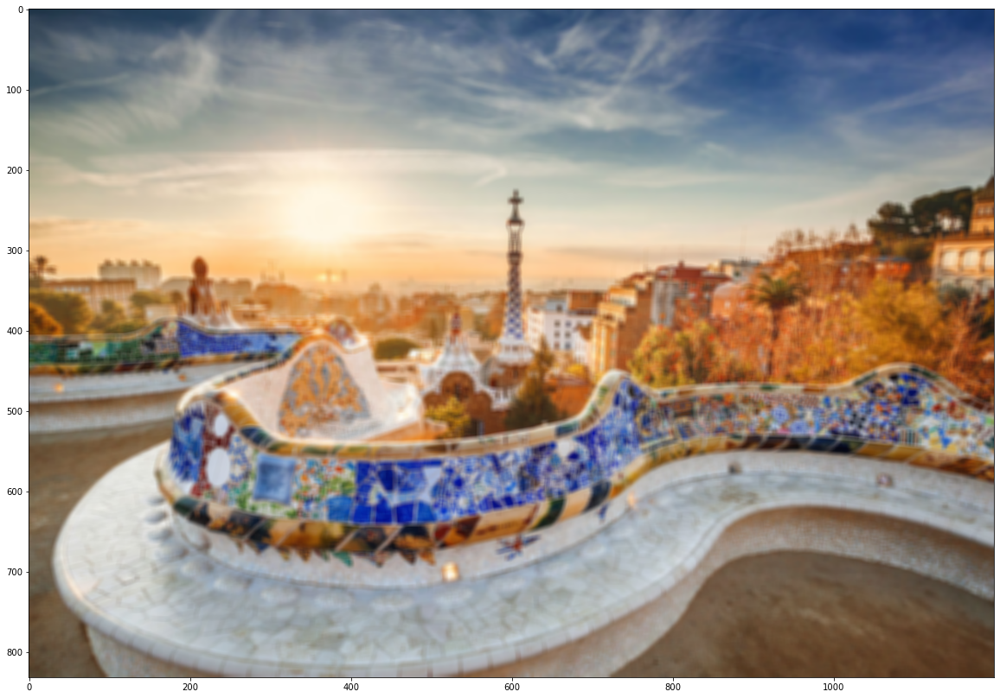

In [62]:
blur_img = cv2.filter2D(img, -1, blur_kernel)
rgb_img = cv2.cvtColor(blur_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_img)

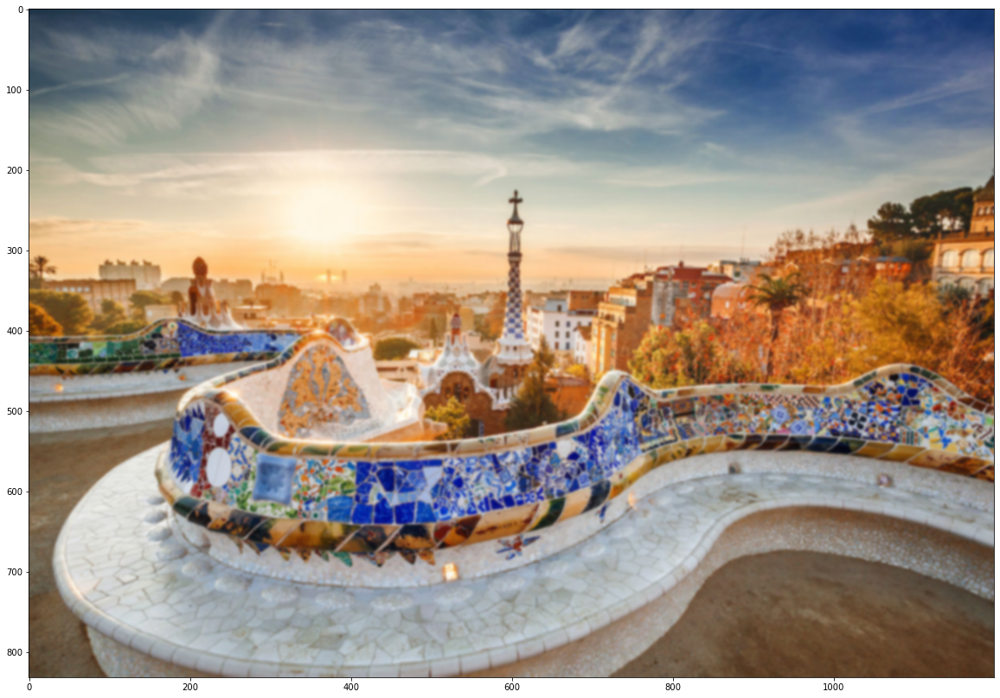

In [65]:
### Gauusian blur
gaussian_blur = cv2.GaussianBlur(img, (7,7), 0)
rgb_img = cv2.cvtColor(gaussian_blur, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_img)

In [66]:
# Sharpening kernel
sharpening_kernel = np.ones((3,3), np.float32)*-1
sharpening_kernel[1,1] = 9
sharpening_kernel

array([[-1., -1., -1.],
       [-1.,  9., -1.],
       [-1., -1., -1.]], dtype=float32)

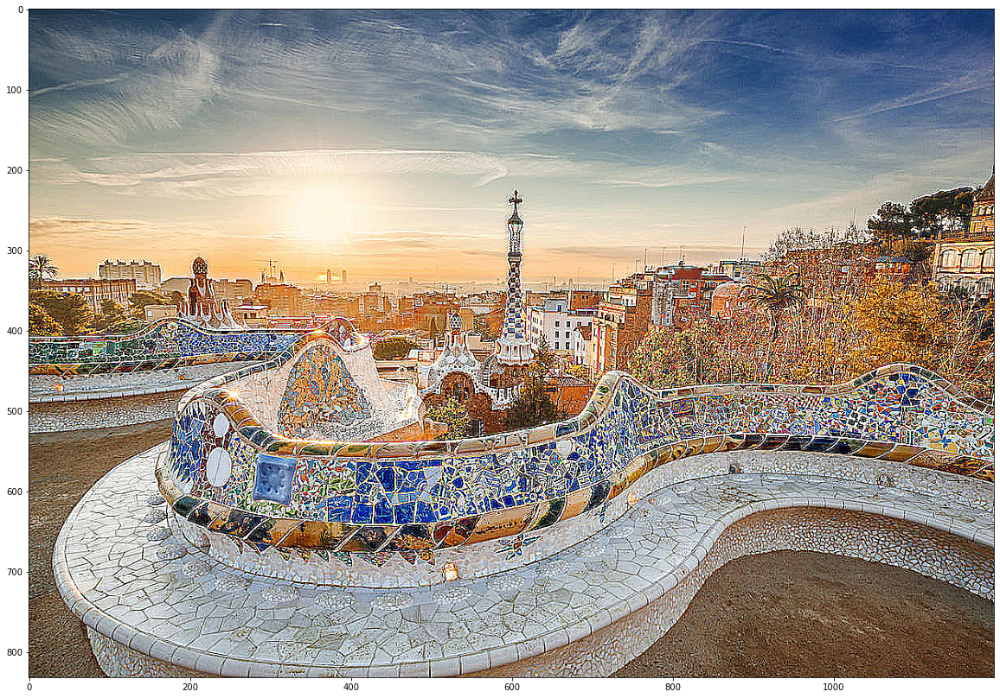

In [67]:
sharp_img = cv2.filter2D(img,-1,sharpening_kernel)
rgb_img = cv2.cvtColor(sharp_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_img)

In [68]:
# Edge Detection Kernel
edge_kernel = np.ones((3,3), np.float32)*-1
edge_kernel[1,1] = 8
edge_kernel

array([[-1., -1., -1.],
       [-1.,  8., -1.],
       [-1., -1., -1.]], dtype=float32)

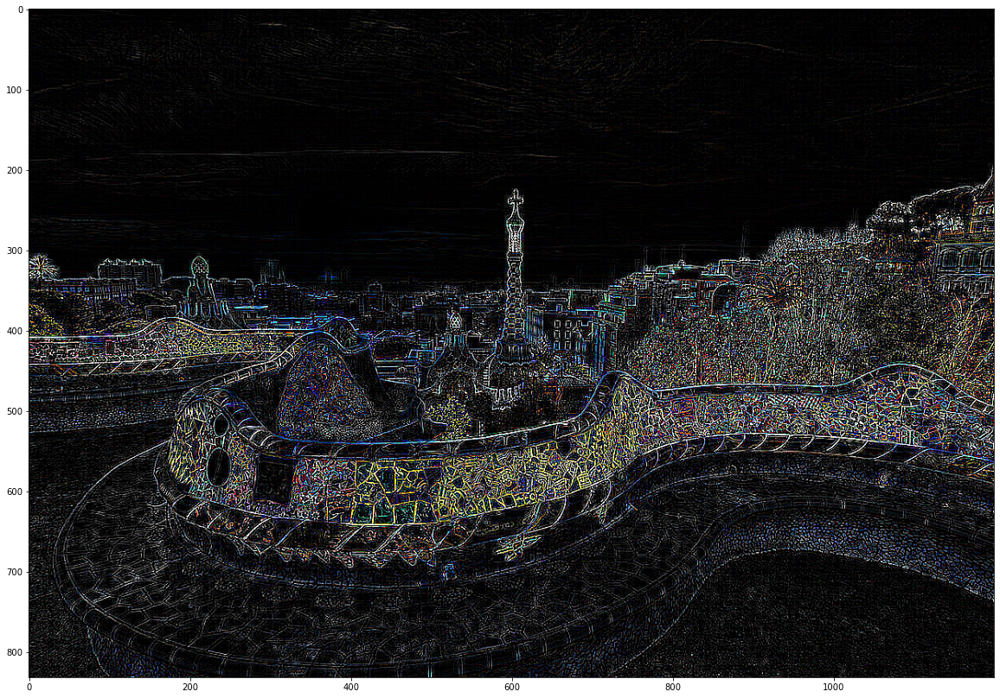

In [70]:
edge_img = cv2.filter2D(img,-1,edge_kernel)
rgb_img = cv2.cvtColor(edge_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,16))
plt.imshow(rgb_img)